In [42]:
import sys
!{sys.executable} -m pip install gitpython
!{sys.executable} -m pip install pyvis

In [43]:

import os
cwd = os.getcwd()
print(cwd)


# Let's declare a var for the path where we're going to download a repository
# Warning: this must end in /
CODE_ROOT_FOLDER="c:/Users/madsg/Uni/Software_architecture/Software_architecture_individual/code_individual_5/content/zeeguu-api/"

from git import Repo
# GitPython is a library that allows us to work easily with git from Python
# https://gitpython.readthedocs.io/en/stable/tutorial.html


# If the file exists, it means we've already downloaded
if not os.path.exists(CODE_ROOT_FOLDER):
  Repo.clone_from("https://github.com/zeeguu/api", CODE_ROOT_FOLDER)

c:\Users\madsg\Uni\Software_architecture\Software_architecture_individual\code_individual_5


In [44]:
# helper function to get a file path w/o having to always provide the /content/zeeguu-api/ prefix
def file_path(file_name):
    return CODE_ROOT_FOLDER+file_name
assert (file_path("zeeguu/core/model/user.py") == "c:/Users/madsg/Uni/Software_architecture/Software_architecture_individual/code_individual_5/content/zeeguu-api/zeeguu/core/model/user.py")

In [45]:
# extracting a module name from a file name
def module_name_from_file_path(full_path):

    # e.g. ../core/model/user.py -> zeeguu.core.model.user

    file_name = full_path[len(CODE_ROOT_FOLDER):]
    file_name = file_name.replace("/__init__.py","")
    file_name = file_name.replace("/",".")
    file_name = file_name.replace(".py","")
    return file_name

assert 'zeeguu.core.model.user' == module_name_from_file_path(file_path('zeeguu/core/model/user.py'))

In [ ]:
# abtract sytax tree ast
import ast

def imports_from_file(file_path):
    with open(file_path, "r", encoding="utf-8") as f:
        tree = ast.parse(f.read(), filename=file_path)

    imports = []

    for node in ast.walk(tree):
        if isinstance(node, ast.Import):
            for alias in node.names:
                imports.append(alias.name)
        elif isinstance(node, ast.ImportFrom):
            if node.module:  # skip `from . import something`
                imports.append(node.module)

    return imports


imports_from_file(file_path('zeeguu/core/model/user.py'))

['datetime',
 'json',
 'random',
 're',
 'sqlalchemy.orm',
 'zeeguu.core',
 'sqlalchemy',
 'sqlalchemy.orm',
 'sqlalchemy.orm.exc',
 'zeeguu.core.language.difficulty_estimator_factory',
 'zeeguu.core.model.language',
 'zeeguu.core.model.learning_cycle',
 'zeeguu.logging',
 'zeeguu.core.util',
 'zeeguu.core.model',
 'zeeguu.logging',
 'zeeguu.core.model.user_cohort_map',
 'zeeguu.core.model',
 'zeeguu.core.model.user_preference',
 'zeeguu.core.model',
 'zeeguu.core.model',
 'zeeguu.core.word_scheduling.basicSR.basicSR',
 'zeeguu.core.sql.queries.query_loader',
 'zeeguu.core.sql.query_building',
 'zeeguu.core.model.bookmark',
 'zeeguu.core.word_scheduling.basicSR.basicSR',
 'zeeguu.core.word_scheduling.basicSR.basicSR',
 'zeeguu.core.word_scheduling.basicSR.basicSR',
 'zeeguu.core.word_scheduling.basicSR.basicSR',
 'zeeguu.core.model.user_article',
 'dateutil.relativedelta',
 'zeeguu.core.model.user_cohort_map',
 'zeeguu.core.model',
 'zeeguu.core.model',
 'zeeguu.core.model.user_reading

In [47]:
# test
print(imports_from_file(file_path('zeeguu/core/model/bookmark.py')))
print(imports_from_file(file_path('zeeguu/core/model/unique_code.py')))

['datetime', 'sqlalchemy', 'sqlalchemy', 'sqlalchemy.orm', 'sqlalchemy.orm.exc', 'zeeguu.core.model.caption', 'zeeguu.core.model.video', 'zeeguu.logging', 'zeeguu.core.bookmark_quality.fit_for_study', 'zeeguu.core.model.article', 'zeeguu.core.model.exercise', 'zeeguu.core.model.exercise_outcome', 'zeeguu.core.model.exercise_source', 'zeeguu.core.model.language', 'zeeguu.core.model.source', 'zeeguu.core.model.text', 'zeeguu.core.model.user', 'zeeguu.core.model.user_word', 'zeeguu.core.model.learning_cycle', 'zeeguu.core.model.bookmark_user_preference', 'zeeguu.core.model.bookmark_context', 'zeeguu.core.model', 'zeeguu.core.util.encoding', 'wordstats', 'zeeguu.core.word_scheduling', 'zeeguu.core.model.context_type', 'zeeguu.core.model.article', 'zeeguu.core.model.video', 'zeeguu.core.word_scheduling', 'zeeguu.core.model.bookmark_context', 'zeeguu.core.model.context_type', 'zeeguu.core.model.context_type', 'zeeguu.core.model.sorted_exercise_log', 'zeeguu.core.model.sorted_exercise_log', '

In [48]:
import pathlib
from pathlib import Path
import networkx as nx

def dependencies_graph(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.Graph()

    for file in files:
        file_path = str(file)

        module_name = module_name_from_file_path(file_path)

        if module_name not in G.nodes:
            G.add_node(module_name)

        for each in imports_from_file(file_path):
            G.add_edge(module_name, each)

    return G

In [49]:
import matplotlib.pyplot as plt

# a function to draw a graph
def draw_graph(G, size, **args):
    plt.figure(figsize=size)
    nx.draw_kamada_kawai(G, **args)
    plt.show()

c:\Users\madsg\Uni\Software_architecture\Software_architecture_individual\code_individual_5\content\zeeguu-api\zeeguu\api\app.py:84: SyntaxWarning: invalid escape sequence '\-'
  ":([a-zA-Z_][a-zA-Z_0-9\-]*)@", ":****@", db_connection_string
c:\Users\madsg\Uni\Software_architecture\Software_architecture_individual\code_individual_5\content\zeeguu-api\zeeguu\core\model\starred_article.py:71: SyntaxWarning: invalid escape sequence '\ '
  """
c:\Users\madsg\Uni\Software_architecture\Software_architecture_individual\code_individual_5\content\zeeguu-api\zeeguu\core\language\strategies\word_rank_difficulty_estimator.py:63: SyntaxWarning: invalid escape sequence '\d'
  words = [w for w in words if re.search("\d", w) == None]


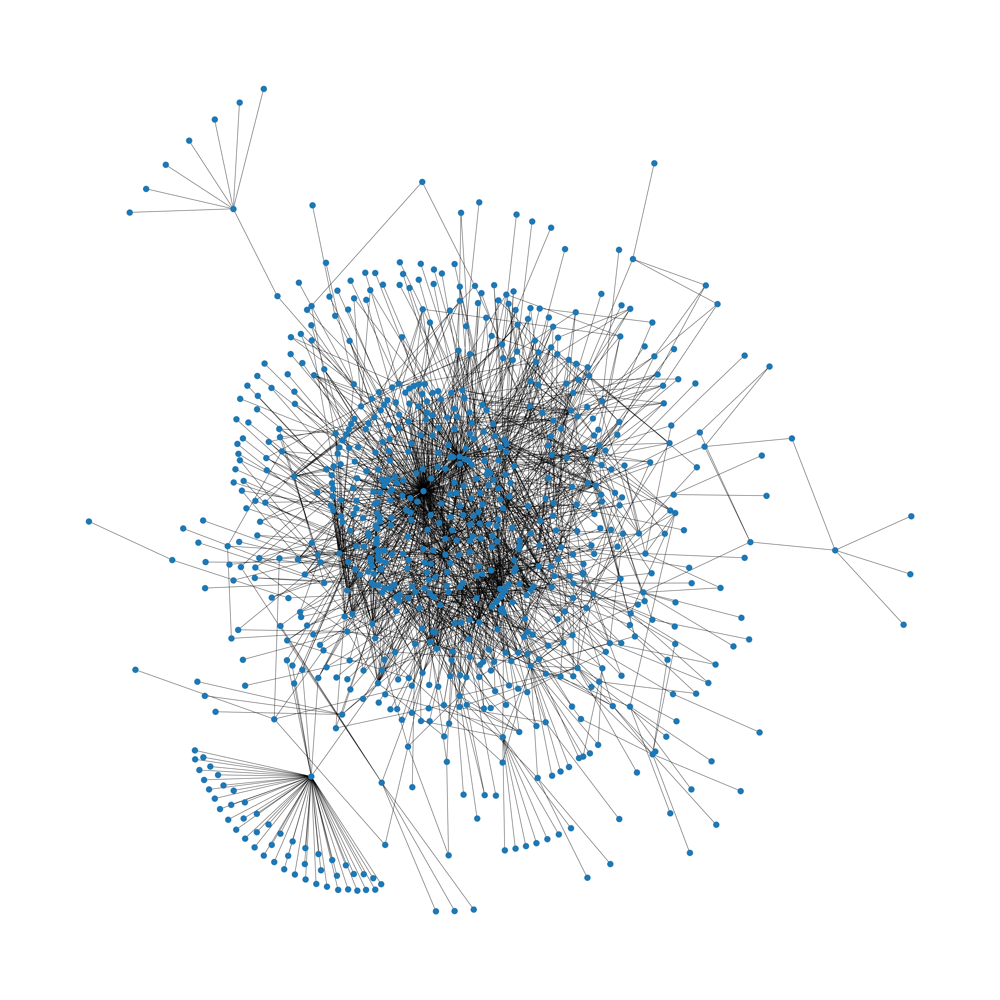

In [50]:
G = dependencies_graph(CODE_ROOT_FOLDER)
draw_graph(G, (40,40), with_labels=False)

ABSTRACTION

In [51]:
# Let's define some relevant modules
def relevant_module(module_name):

  if "test" in module_name:
    return False


  if module_name.startswith("zeeguu"):
    return True


  return False

In [52]:
# However, if we think a bit more about it, we realize that a dependency graph
# is a directed graph (e.g. module A depends on m)
# with any kinds of graph either directed (nx.DiGraph) or
# non-directed (nx.Graph)

def dependencies_digraph(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module(source_module):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

            if relevant_module(target_module):
              G.add_edge(source_module, target_module)


    return G


c:\Users\madsg\Uni\Software_architecture\Software_architecture_individual\code_individual_5\content\zeeguu-api\zeeguu\api\app.py:84: SyntaxWarning: invalid escape sequence '\-'
  ":([a-zA-Z_][a-zA-Z_0-9\-]*)@", ":****@", db_connection_string
c:\Users\madsg\Uni\Software_architecture\Software_architecture_individual\code_individual_5\content\zeeguu-api\zeeguu\core\model\starred_article.py:71: SyntaxWarning: invalid escape sequence '\ '
  """
c:\Users\madsg\Uni\Software_architecture\Software_architecture_individual\code_individual_5\content\zeeguu-api\zeeguu\core\language\strategies\word_rank_difficulty_estimator.py:63: SyntaxWarning: invalid escape sequence '\d'
  words = [w for w in words if re.search("\d", w) == None]


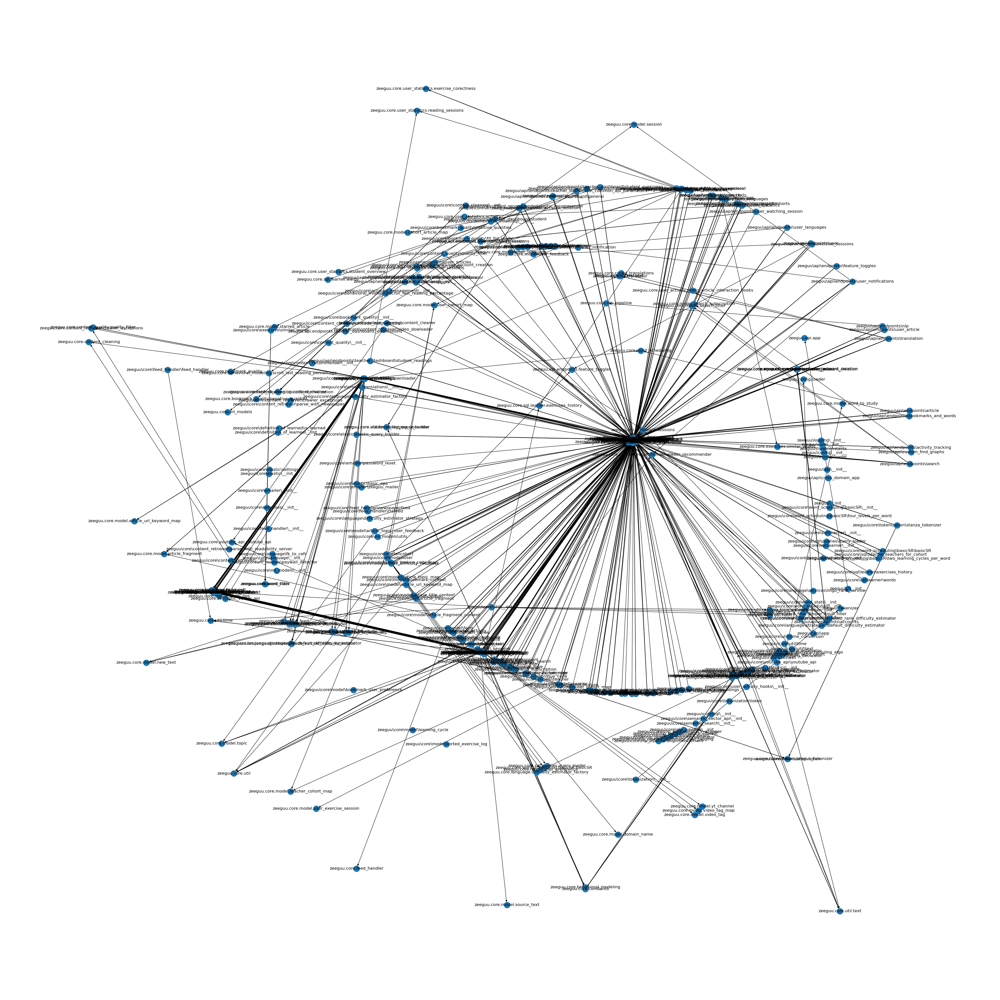

In [53]:
# Looking at the directed graph
DG = dependencies_digraph(CODE_ROOT_FOLDER)
draw_graph(DG, (40,40), with_labels=True)

In [54]:
# extracts the parent of depth X
def top_level_package(module_name, depth=1):
     # Normalize the module name: replace slashes with dots
    module_name = module_name.replace("\\", ".")
    
    # Split by dots and return the first 'depth' components
    components = module_name.split(".")
    return ".".join(components[:depth])

assert (top_level_package("zeeguu.core.model.util", 1) == "zeeguu")
assert (top_level_package("zeeguu.core.model.util", 2) == "zeeguu.core")

In [55]:
def abstracted_to_top_level(G, depth=2):
    aG = nx.DiGraph()
    for each in G.edges():
        src = top_level_package(each[0], depth)
        dst = top_level_package(each[1], depth)

        if src != dst:
          aG.add_edge(src, dst)

    return aG

In [56]:
ADG = abstracted_to_top_level(DG, 3)

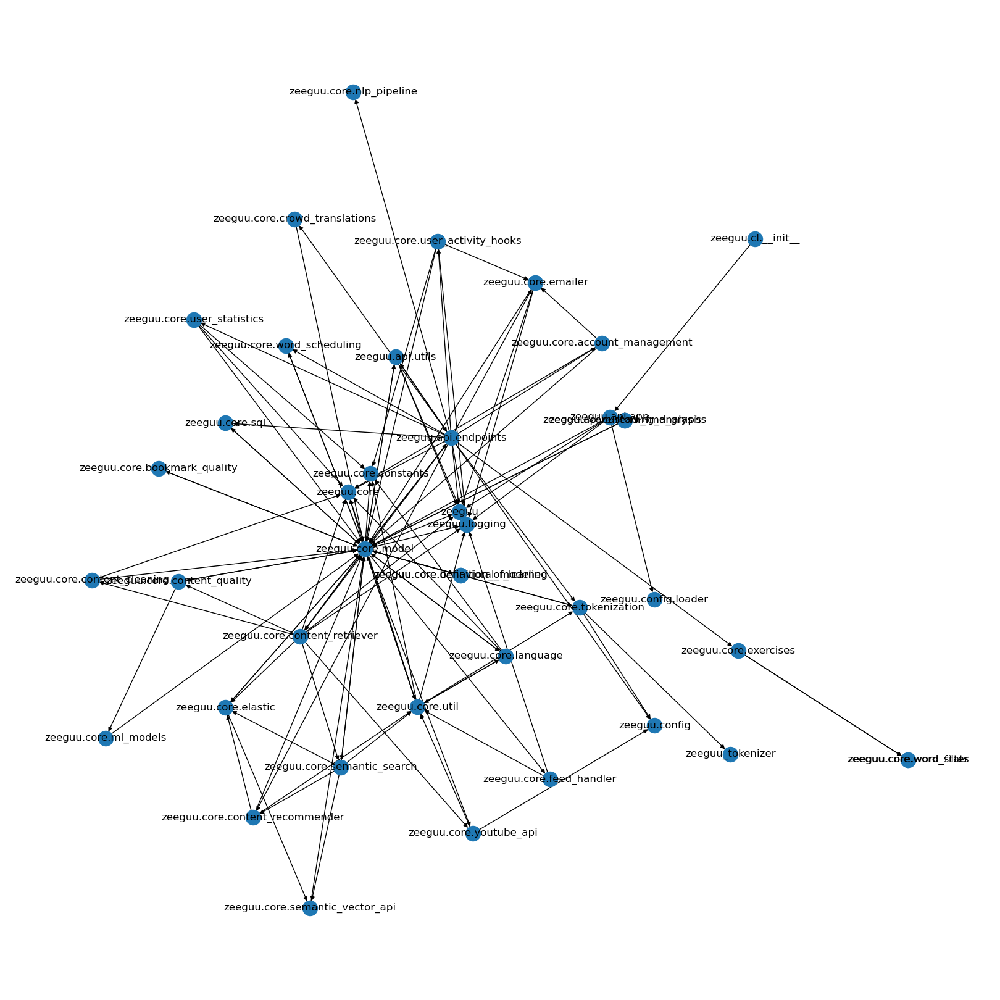

In [57]:
draw_graph(ADG, (16,16), with_labels=True)

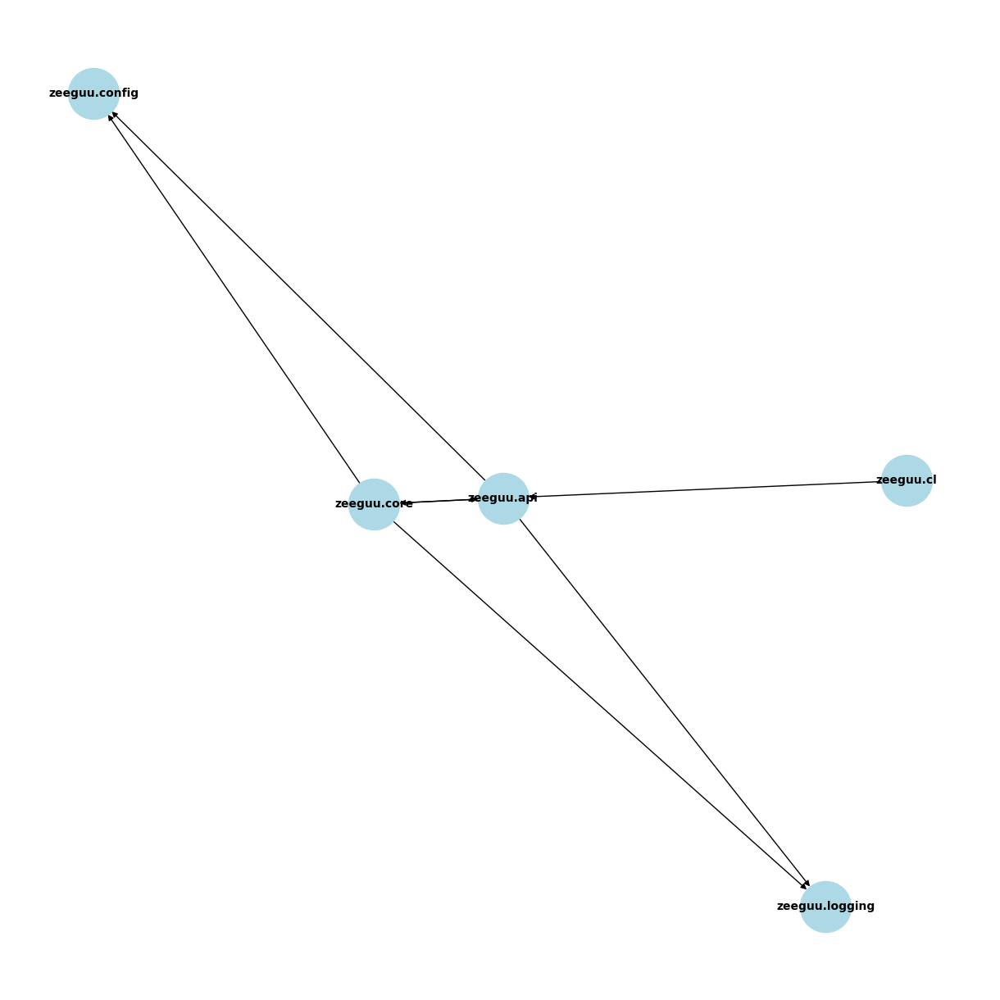

In [58]:
import networkx as nx
# 

def top_level_package(module_name, depth=1):
    module_name = module_name.replace("\\", ".")
    components = module_name.split(".")
    if len(components) < depth:
        return None  # Too shallow, discard
    return ".".join(components[:depth])

def abstracted_to_top_level(G, depth=2):
    aG = nx.DiGraph()

    for src_raw, dst_raw in G.edges():
        src = top_level_package(src_raw, depth)
        dst = top_level_package(dst_raw, depth)

        # Skip if either is too shallow
        if src is None or dst is None or src == dst:
            continue

        aG.add_edge(src, dst)

    return aG

# Abstract the graph to the second level (i.e., top-level folders)
ADG = abstracted_to_top_level(DG, 2)
# Adjust the size of the graph using figsize
plt.figure(figsize=(12, 12))  # You can modify this to any size, e.g., (16, 16) or (10, 10)


# Optionally, you can visualize the abstracted graph
import matplotlib.pyplot as plt
nx.draw(ADG, with_labels=True, node_size=2000, node_color='lightblue', font_size=10, font_weight='bold')
plt.show()


In [63]:
import os
# Question metric how many files does each subfolder have?

def count_files_at_depth(base_dir, target_depth):
    folder_file_count = {}

    # Walk through the directory structure
    for root, dirs, files in os.walk(base_dir):
        # Calculate the depth of the current folder relative to the base directory
        relative_path = os.path.relpath(root, base_dir)
        depth = relative_path.count(os.sep)  # count how many subdirectories there are

        # If the current depth matches the target depth, count the files in the folder
        if depth == target_depth:
            # Get the subfolder path (relative to base_dir) and count files
            subfolder = relative_path
            folder_file_count[subfolder] = len(files)

    return folder_file_count

# Example usage
base_directory = CODE_ROOT_FOLDER  # Change this to your project directory
target_depth = 2  # Change this to your desired depth
file_count_per_subfolder = count_files_at_depth(base_directory, target_depth)

# Print the result
# Print the result sorted by file count (descending)
for subfolder, file_count in sorted(file_count_per_subfolder.items(), key=lambda item: item[1], reverse=True):
    print(f"Subfolder: {subfolder}, File Count: {file_count}")


# Now, separately check for a specific folder (e.g., "zeeguu/core") and sum its file count
total_files_in_core = 0
for folderCore, file_count in file_count_per_subfolder.items():
    # Check if the folder starts with 'zeeguu/core' (handle relative path)
    if folderCore.startswith("zeeguu\core"):
        total_files_in_core += file_count

# Print the total file count for "zeeguu/core" and its subfolders
print(f"Total files in 'zeeguu/core' and its subfolders: {total_files_in_core}")


Subfolder: zeeguu\core\model, File Count: 68
Subfolder: zeeguu\api\endpoints, File Count: 27
Subfolder: zeeguu\core\test, File Count: 22
Subfolder: zeeguu\api\test, File Count: 11
Subfolder: zeeguu\core\util, File Count: 10
Subfolder: zeeguu\core\content_retriever, File Count: 8
Subfolder: zeeguu\api\utils, File Count: 7
Subfolder: zeeguu\core\nlp_pipeline, File Count: 7
Subfolder: tools\old\es_v8_migration, File Count: 6
Subfolder: zeeguu\core\elastic, File Count: 6
Subfolder: zeeguu\core\user_statistics, File Count: 6
Subfolder: zeeguu\core\tokenization, File Count: 5
Subfolder: zeeguu\core\bookmark_quality, File Count: 4
Subfolder: zeeguu\core\emailer, File Count: 4
Subfolder: zeeguu\core\feed_handler, File Count: 4
Subfolder: zeeguu\core\language, File Count: 4
Subfolder: zeeguu\core\account_management, File Count: 3
Subfolder: zeeguu\core\content_cleaning, File Count: 3
Subfolder: zeeguu\core\ml_models, File Count: 3
Subfolder: zeeguu\core\word_filter, File Count: 3
Subfolder: .gi

<>:36: SyntaxWarning: invalid escape sequence '\c'
<>:36: SyntaxWarning: invalid escape sequence '\c'
C:\Users\madsg\AppData\Local\Temp\ipykernel_29672\929312305.py:36: SyntaxWarning: invalid escape sequence '\c'
  if folderCore.startswith("zeeguu\core"):


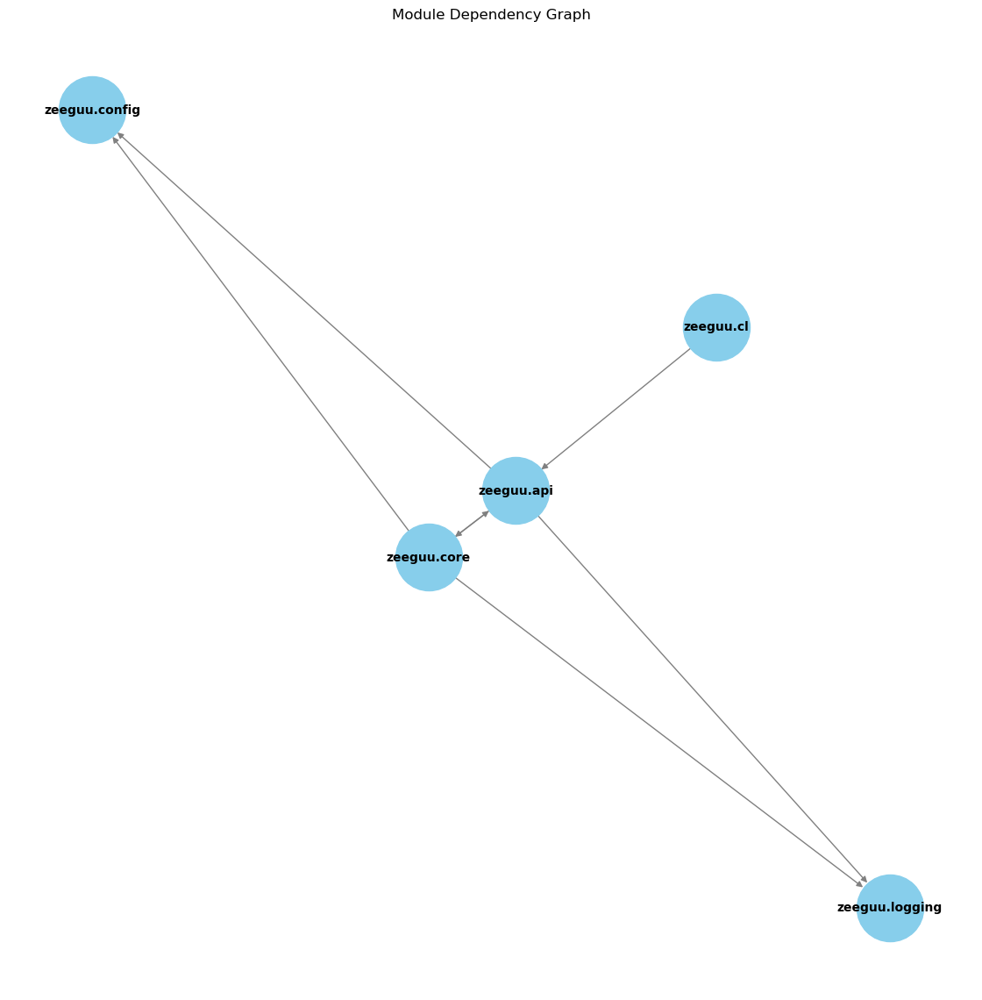

PageRank Scores:
zeeguu.api: 0.2512984670834265
zeeguu.config: 0.2304106339414764
zeeguu.logging: 0.2304106339414764
zeeguu.core: 0.1795408273474705
zeeguu.cl: 0.1083394376861502
Module Dependencies:
Module: zeeguu.api has dependencies: ['zeeguu.config', 'zeeguu.logging', 'zeeguu.core']
Module: zeeguu.config has dependencies: []
Module: zeeguu.logging has dependencies: []
Module: zeeguu.core has dependencies: ['zeeguu.logging', 'zeeguu.api', 'zeeguu.config']
Module: zeeguu.cl has dependencies: ['zeeguu.api']


In [60]:
import networkx as nx
from pathlib import Path
import ast

ADG2 = abstracted_to_top_level(DG, 2)

# Draw the dependency graph
plt.figure(figsize=(11, 11))
nx.draw(ADG2, with_labels=True, node_size=3000, node_color='skyblue', font_size=10, font_weight='bold', edge_color='gray')
plt.title("Module Dependency Graph")
plt.show()


# Apply PageRank to the dependency graph
pagerank_scores = nx.pagerank(ADG2, alpha=0.85)

# Print the PageRank scores
print("PageRank Scores:")
for node, score in pagerank_scores.items():
    print(f"{node}: {score}")

print("Module Dependencies:")
for node in ADG2.nodes:
    print(f"Module: {node} has dependencies: {[n for n in ADG2.neighbors(node)]}")




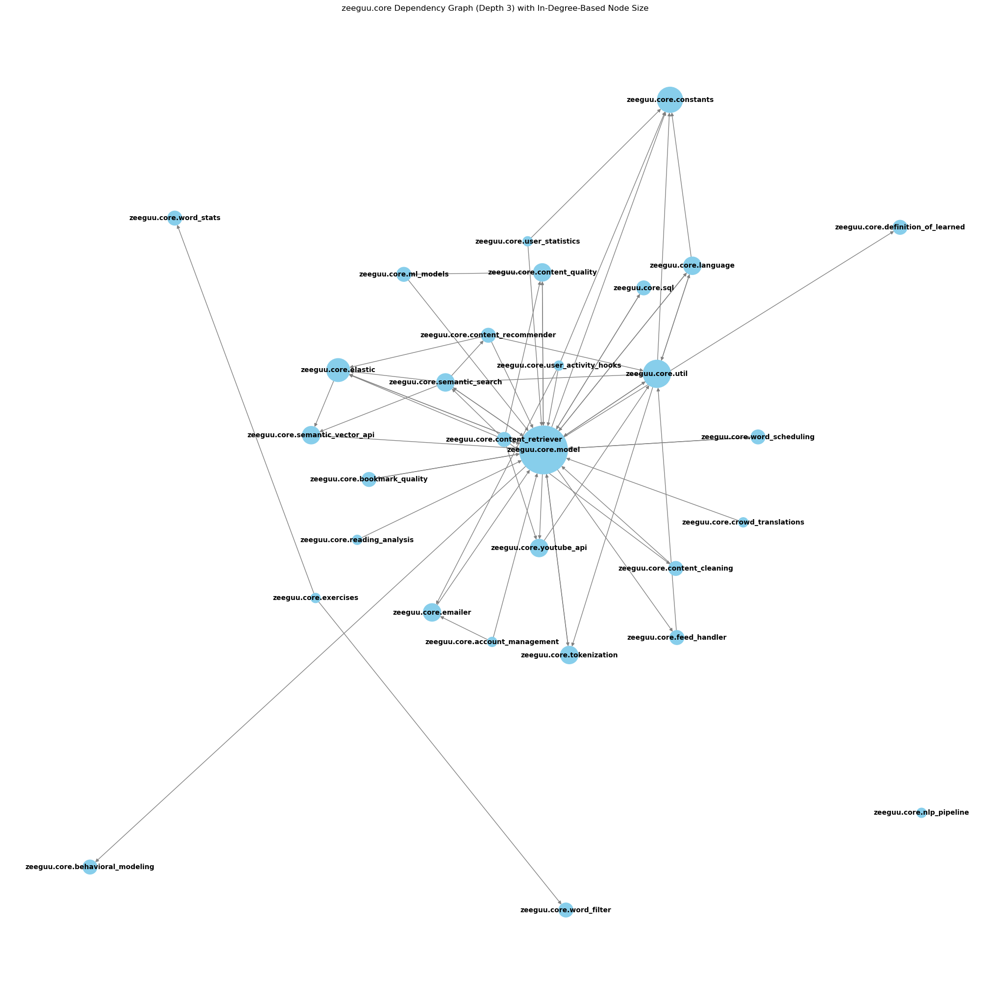

PageRank Scores:
zeeguu.core.model: 0.2760916028546785
zeeguu.core.account_management: 0.009207801118155503
zeeguu.core.emailer: 0.015729891434644698
zeeguu.core.user_activity_hooks: 0.009207801118155503
zeeguu.core.word_scheduling: 0.024852678893691475
zeeguu.core.exercises: 0.009207801118155503
zeeguu.core.nlp_pipeline: 0.009207801118155503
zeeguu.core.tokenization: 0.04428356510083305
zeeguu.core.content_recommender: 0.0140313764595708
zeeguu.core.crowd_translations: 0.009207801118155503
zeeguu.core.content_retriever: 0.024852678893691475
zeeguu.core.user_statistics: 0.009207801118155503
zeeguu.core.sql: 0.024852678893691475
zeeguu.core.bookmark_quality: 0.024852678893691475
zeeguu.core.content_cleaning: 0.012728686229996889
zeeguu.core.content_quality: 0.028373564005532866
zeeguu.core.ml_models: 0.021266739471693746
zeeguu.core.elastic: 0.03717260706013242
zeeguu.core.util: 0.09144256353150292
zeeguu.core.semantic_search: 0.028373564005532866
zeeguu.core.youtube_api: 0.028373564005

In [66]:
ADG3 = abstracted_to_top_level(DG, 3)


import networkx as nx
import matplotlib.pyplot as plt

# Create a subgraph containing only modules within 'zeeguu.core'
def subgraph_within_namespace(G, namespace="zeeguu.core"):
    nodes_in_core = [n for n in G.nodes if n.startswith(namespace)]
    return G.subgraph(nodes_in_core).copy()

# Extract the core subgraph
core_subgraph = subgraph_within_namespace(ADG3, "zeeguu.core")

# Calculate in-degrees (number of incoming edges) for each node
in_degrees = dict(core_subgraph.in_degree())

# Normalize node sizes based on in-degree (larger size for more incoming edges)
max_in_degree = max(in_degrees.values())
node_sizes = node_sizes = [200 + (4800 * in_degrees[node] / max_in_degree) for node in core_subgraph.nodes]

# Set up layout
pos = nx.spring_layout(core_subgraph, k=0.5, iterations=50, seed=42)

# Draw the graph
plt.figure(figsize=(20, 20))
nx.draw(core_subgraph, pos,
        with_labels=True,
        node_size=node_sizes,  # Adjust node size based on in-degree
        node_color='skyblue',
        font_size=10,
        font_weight='bold',
        edge_color='gray')

plt.title("zeeguu.core Dependency Graph (Depth 3) with In-Degree-Based Node Size")
plt.show()

# Apply PageRank to the dependency graph
pagerank_scores = nx.pagerank(core_subgraph, alpha=0.85)

# Print the PageRank scores
print("PageRank Scores:")
for node, score in pagerank_scores.items():
    print(f"{node}: {score}")

# Print module dependencies
print("Module Dependencies:")
for node in core_subgraph.nodes:
    print(f"Module: {node} has dependencies: {[n for n in core_subgraph.neighbors(node)]}")



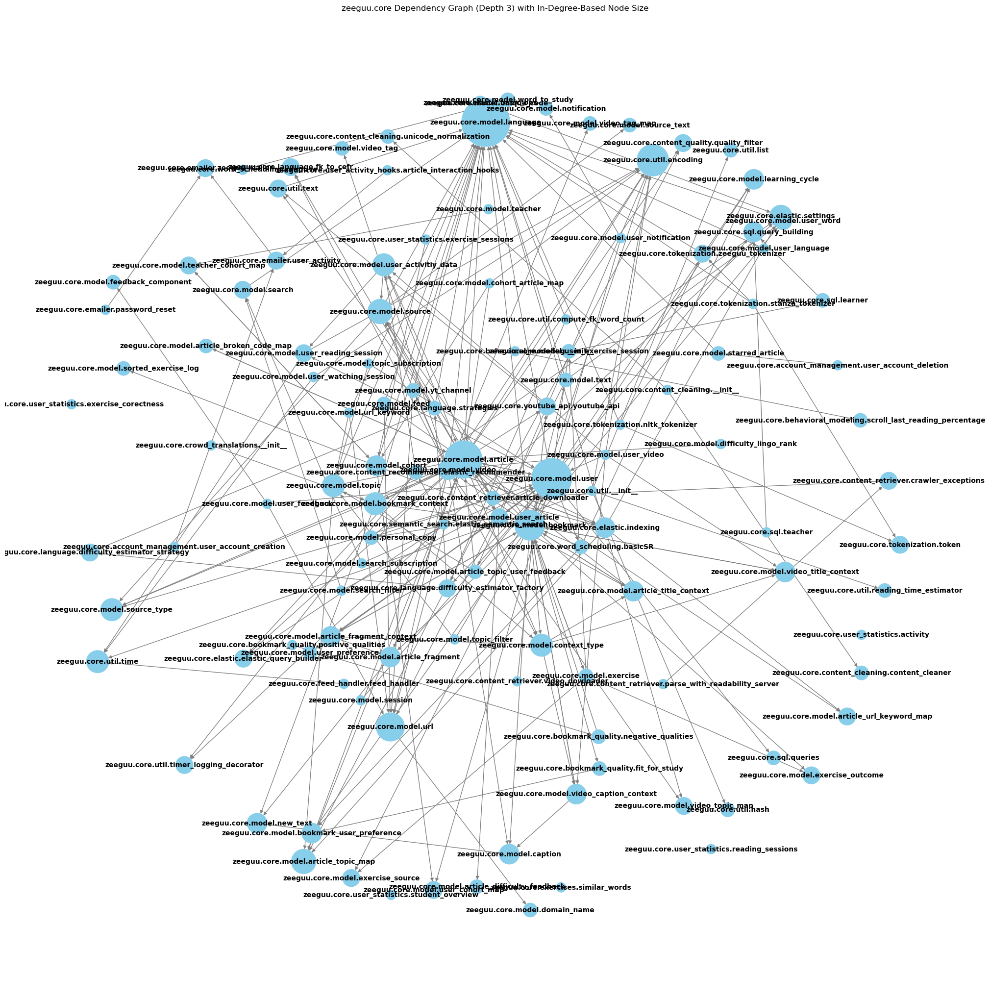

In [68]:
ADG4 = abstracted_to_top_level(DG, 4)


import networkx as nx
import matplotlib.pyplot as plt

# Create a subgraph containing only modules within 'zeeguu.core'
def subgraph_within_namespace(G, namespace="zeeguu.core"):
    nodes_in_core = [n for n in G.nodes if n.startswith(namespace)]
    return G.subgraph(nodes_in_core).copy()

# Extract the core subgraph
core_subgraph = subgraph_within_namespace(ADG4, "zeeguu.core")

# Calculate in-degrees (number of incoming edges) for each node
in_degrees = dict(core_subgraph.in_degree())

# Normalize node sizes based on in-degree (larger size for more incoming edges)
max_in_degree = max(in_degrees.values())
node_sizes = node_sizes = [200 + (4800 * in_degrees[node] / max_in_degree) for node in core_subgraph.nodes]

# Set up layout
pos = nx.spring_layout(core_subgraph, k=0.5, iterations=50, seed=42)

# Draw the graph
plt.figure(figsize=(20, 20))
nx.draw(core_subgraph, pos,
        with_labels=True,
        node_size=node_sizes,  # Adjust node size based on in-degree
        node_color='skyblue',
        font_size=10,
        font_weight='bold',
        edge_color='gray')

plt.title("zeeguu.core Dependency Graph (Depth 3) with In-Degree-Based Node Size")
plt.show()


In [76]:
import ast
import os

def count_methods_in_file(file_path):
    with open(file_path, "r", encoding="utf-8") as f:
        tree = ast.parse(f.read(), filename=file_path)

    method_count = 0
    for node in ast.walk(tree):
        if isinstance(node, ast.FunctionDef):  # catches both top-level and class methods
            method_count += 1

    return method_count

# Directory to scan
model_dir = "c:/Users/madsg/Uni/Software_architecture/Software_architecture_individual/code_individual_5/content/zeeguu-api/zeeguu/core/model"
print(os.listdir(model_dir))


# Store counts
method_counts = {}

# Walk through the directory
for root, _, files in os.walk(model_dir):
    for file in files:
        if file.endswith(".py"):
            file_path = os.path.join(root, file)
            count = count_methods_in_file(file_path)
            method_counts[file_path] = count

# Print results sorted by count descending
for path, count in sorted(method_counts.items(), key=lambda x: x[1], reverse=True):
    print(f"{path}: {count} methods")


['article.py', 'article_broken_code_map.py', 'article_difficulty_feedback.py', 'article_fragment.py', 'article_fragment_context.py', 'article_title_context.py', 'article_topic_map.py', 'article_topic_user_feedback.py', 'article_url_keyword_map.py', 'bookmark.py', 'bookmark_context.py', 'bookmark_user_preference.py', 'caption.py', 'cohort.py', 'cohort_article_map.py', 'context_type.py', 'difficulty_lingo_rank.py', 'domain_name.py', 'exercise.py', 'exercise_outcome.py', 'exercise_source.py', 'feed.py', 'feedback_component.py', 'language.py', 'learning_cycle.py', 'new_text.py', 'notification.py', 'personal_copy.py', 'search.py', 'search_filter.py', 'search_subscription.py', 'session.py', 'sorted_exercise_log.py', 'source.py', 'source_text.py', 'source_type.py', 'starred_article.py', 'teacher.py', 'teacher_cohort_map.py', 'text.py', 'topic.py', 'topic_filter.py', 'topic_subscription.py', 'unique_code.py', 'url.py', 'url_keyword.py', 'user.py', 'user_activitiy_data.py', 'user_article.py', '

c:/Users/madsg/Uni/Software_architecture/Software_architecture_individual/code_individual_5/content/zeeguu-api/zeeguu/core/model\starred_article.py:71: SyntaxWarning: invalid escape sequence '\ '
  """
